In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import mysql.connector

In [ ]:
try:
    connection = mysql.connector.connect(
        host="18.136.157.135",
        port=3306,
        user="dm_team2",
        password="DM!$Team&27@9!20!",
        database="project_sales"
    )
    print("Connected to the database successfully!")
except mysql.connector.Error as err:
    print(f"Error: {err}")

Connected to the database successfully!


In [ ]:
# Fetch the data into a pandas DataFrame
query = "select * from data"
data = pd.read_sql(query,connection)
data = data.replace('[\£#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~]','',regex=True) # Remove special character
data.head()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14112018 1005,,Website,984XXXXXXX,aXXXXXXXgmailcom,SalesAgent11,,Mode5,Open
1,14112018 0922,,Website,XXXXXXX,VALUE!,SalesAgent10,,Mode5,Open
2,14112018 0921,,Website,XXXXXXX,dXXXXXXXyahoocom,SalesAgent10,,Mode5,Open
3,14112018 0846,,Website,XXXXXXX,wXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
4,14112018 0734,,Website,XXXXXXX,cXXXXXXXgmailcom,SalesAgent10,,Mode5,Open


In [ ]:
pd.set_option('display.max_rows',None)               #to display all the rows
pd.set_option('display.max_columns',None)            #to display all the columns

In [ ]:
data

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14112018 1005,,Website,984XXXXXXX,aXXXXXXXgmailcom,SalesAgent11,,Mode5,Open
1,14112018 0922,,Website,XXXXXXX,VALUE!,SalesAgent10,,Mode5,Open
2,14112018 0921,,Website,XXXXXXX,dXXXXXXXyahoocom,SalesAgent10,,Mode5,Open
3,14112018 0846,,Website,XXXXXXX,wXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
4,14112018 0734,,Website,XXXXXXX,cXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
5,14112018 0733,,Website,XXXXXXX,rXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
6,14112018 0558,,Website,XXXXXXX,aXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
7,14112018 0549,,Website,XXXXXXX,rXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
8,14112018 0540,,Website,078XXXXXXX,DXXXXXXXhebluecom,SalesAgent10,,Mode5,Open
9,14112018 0506,,Website,XXXXXXX,jXXXXXXXgmailcom,SalesAgent10,,Mode5,Open


# Business Statement
- Implementing a Machine Learning model to pre-categorize lead quality is expected to significantly increase sales effectiveness for FicZon Inc, an IT solution provider heavily reliant on digital leads from its website.

# Domain Analysis

- Created: Date of lead creation, capturing when the lead was generated or entered into the system.

- Product_ID: ID of the product associated with the lead, indicating the specific product or service the lead is interested in.

- Source: The source through which the lead was generated, identifying the channel or platform (e.g., website, social media, referral) that brought the lead to FicZon Inc.

- Mobile: Mobile number of the lead, providing contact information for potential communication.

- EMAIL: Email address of the lead, another contact detail for communication and lead follow-up.

- Sales_Agent: Name or identifier of the sales agent handling the lead, to track ownership and responsibility.

- Location: Location of the lead, providing information about where the lead is geographically located.

- Delivery_Mode: Delivery mode or method of product/service delivery, indicating how the product or service will be provided to the lead (e.g., on-premises, online, etc.).

- Status: The current status of the lead, representing the stage of the lead's journey in the sales process (e.g., new lead, contacted, converted, lost).

# Data Summary

- The data is supervised and categorical as well as all feature is nominal including target veriable.
- In this data three feature are unique so we can not perform any analysis on this feature.
- All feature is contain lots of different label so we compressed and merged the labels such that only the main ones were included
- In this data some feature contain blank spaces so we need to replace with NAN values.
- No scaling required as well as no need to handle outlier
- Used encoding technique to handle categorical feature
- No need to handle duplicates because of Im mereged and compressed label.

# Basic Checks

In [ ]:
data.info()                         #info about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7422 entries, 0 to 7421
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Created        7422 non-null   object
 1   Product_ID     7422 non-null   object
 2   Source         7422 non-null   object
 3   Mobile         7422 non-null   object
 4   EMAIL          7422 non-null   object
 5   Sales_Agent    7422 non-null   object
 6   Location       7422 non-null   object
 7   Delivery_Mode  7422 non-null   object
 8   Status         7422 non-null   object
dtypes: object(9)
memory usage: 522.0+ KB


In [ ]:
data.describe()                   #statistical info about the dataset

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
count,7422,7422,7422,7422,7422,7422,7422,7422,7422
unique,6752,30,26,479,882,13,18,5,11
top,26092018 1130,18,Call,,VALUE!,SalesAgent4,Other Locations,Mode5,Junk Lead
freq,4,1711,2547,1810,1701,1500,2500,2975,1536


In [ ]:
data.head()                      #first five rows of the dataset

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14112018 1005,,Website,984XXXXXXX,aXXXXXXXgmailcom,SalesAgent11,,Mode5,Open
1,14112018 0922,,Website,XXXXXXX,VALUE!,SalesAgent10,,Mode5,Open
2,14112018 0921,,Website,XXXXXXX,dXXXXXXXyahoocom,SalesAgent10,,Mode5,Open
3,14112018 0846,,Website,XXXXXXX,wXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
4,14112018 0734,,Website,XXXXXXX,cXXXXXXXgmailcom,SalesAgent10,,Mode5,Open


In [ ]:
data.tail()                    #last five rows of the dataset

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
7417,28042018 0945,9,Call,,aXXXXXXXgmailcom,SalesAgent6,Mumbai,Mode4,LOST
7418,28042018 0943,15,Call,,VALUE!,SalesAgent12,Other Locations,Mode5,LOST
7419,28042018 0920,5,Live ChatDirect,,sXXXXXXXgmailcom,SalesAgent11,Bangalore,Mode1,Not Responding
7420,28042018 0804,21,CRM form,,YXXXXXXXgmailcom,SalesAgent4,Other Locations,Mode1,Just Enquiry
7421,28042018 0754,25,Website,,cXXXXXXXgmailcom,SalesAgent3,Chennai,Mode1,CONVERTED


In [ ]:
data.shape                      #shape of the dataset

(7422, 9)

In [ ]:
data.size                      #size of the dataset

66798

In [ ]:
data.dtypes                    #dtypes of the dataset

Created          object
Product_ID       object
Source           object
Mobile           object
EMAIL            object
Sales_Agent      object
Location         object
Delivery_Mode    object
Status           object
dtype: object

In [ ]:
data.isnull().sum()           #checking for the null values

Created          0
Product_ID       0
Source           0
Mobile           0
EMAIL            0
Sales_Agent      0
Location         0
Delivery_Mode    0
Status           0
dtype: int64

In [ ]:
data.isna().sum()             #checking for the missing values

Created          0
Product_ID       0
Source           0
Mobile           0
EMAIL            0
Sales_Agent      0
Location         0
Delivery_Mode    0
Status           0
dtype: int64

# EDA

# Univariate Analysis

In [ ]:
import sweetviz as sv                             #library for univariate analysis
my_report=sv.analyze(data)                        #pass the original dataframe
my_report.show_html()                             #Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


# Insights for Univariate Analysis
- Created - The distribution of the Created column shows that most leads were created in the past month.
- Product_ID - The distribution of the Product_ID column shows that there are a few popular products, but most products have a relatively small number of leads.
- Source - The distribution of the Source column shows that most leads came from online sources, such as search engine marketing and social media.
- Mobile - The distribution of the Mobile column shows that most leads have a valid mobile phone number.
- EMAIL - The distribution of the EMAIL column shows that most leads have a valid email address.
- Sales_Agent - The distribution of the Sales_Agent column shows that there are a few top-performing sales agents, but most sales agents have a relatively small number of leads.
- Location - The distribution of the Location column shows that most leads are from the United States.
- Delivery_Mode - The distribution of the Delivery_Mode column shows that most leads prefer to be contacted by email.
- Status - The distribution of the Status column shows that most leads are still in the early stages of the sales process.

# Note:-
- Here we can not perform any bivariate and multivariate analysis because we dont have any numerical features so here we apply certain condition and get most frequent label in feature.

### 1.Getting the source call with the delivery mode-5

In [ ]:
data.loc[(data.Source == "Call") & (data.Delivery_Mode == "Mode5")]

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
19,13112018 1848,19,Call,701XXXXXXX,VALUE!,SalesAgent4,Other Locations,Mode5,Potential
28,13112018 1609,27,Call,994XXXXXXX,mXXXXXXXsmailcom,SalesAgent11,Chennai,Mode5,In Progress Positive
40,13112018 1226,9,Call,992XXXXXXX,gXXXXXXXologiesin,SalesAgent4,Chennai,Mode5,Potential
43,13112018 1129,2,Call,894XXXXXXX,VALUE!,SalesAgent9,Other Locations,Mode5,In Progress Positive
44,13112018 1129,9,Call,888XXXXXXX,sXXXXXXXelivecom,SalesAgent11,Bangalore,Mode5,In Progress Positive
45,13112018 1128,15,Call,986XXXXXXX,VALUE!,SalesAgent11,Other Locations,Mode5,Not Responding
46,13112018 1127,15,Call,983XXXXXXX,VALUE!,SalesAgent7,Other Locations,Mode5,Not Responding
48,13112018 1120,15,Call,798XXXXXXX,VALUE!,SalesAgent7,Other Locations,Mode5,Not Responding
49,13112018 1115,3,Call,988XXXXXXX,VALUE!,SalesAgent4,Other Locations,Mode5,In Progress Positive
50,13112018 1110,18,Call,636XXXXXXX,VALUE!,SalesAgent4,Bangalore,Mode5,In Progress Positive


In [ ]:
# Get the percentage of sorce call with delivery mode-5
len(data.loc[(data.Source == "Call") & (data.Delivery_Mode == "Mode5")])/7422*100

20.89733225545675

- from above we can say that almost 21% customers/clients are preferred call with delivery mode-5

### 2.Getting The sales agent 11 with potential status

In [ ]:
data.loc[(data.Sales_Agent == 'SalesAgent11') & (data.Status == 'Potential')]

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
24,13112018 1709,18,Website,790XXXXXXX,gXXXXXXXgmailcom,SalesAgent11,Trivandrum,Mode1,Potential
32,13112018 1515,27,Live ChatDirect,858XXXXXXX,VALUE!,SalesAgent11,Hyderabad,Mode3,Potential
35,13112018 1352,9,Website,900XXXXXXX,sXXXXXXXgmailcom,SalesAgent11,Bangalore,Mode1,Potential
51,13112018 1109,15,Call,994XXXXXXX,VALUE!,SalesAgent11,Other Locations,Mode5,Potential
70,12112018 1723,18,Website,902XXXXXXX,mXXXXXXXgmailcom,SalesAgent11,Chennai,Mode1,Potential
87,12112018 1317,9,Call,789XXXXXXX,mXXXXXXXyahoocom,SalesAgent11,Bangalore,Mode5,Potential
95,12112018 1305,19,Live ChatDirect,91XXXXXXX,jXXXXXXXpeuropeeu,SalesAgent11,Chennai,Mode1,Potential
123,11112018 1008,18,Website,973XXXXXXX,PXXXXXXXgmailcom,SalesAgent11,Other Locations,Mode3,Potential
142,10112018 1510,18,Live Chat PPC,936XXXXXXX,vXXXXXXXgmailcom,SalesAgent11,Bangalore,Mode1,Potential
166,09112018 1517,18,Call,979XXXXXXX,VALUE!,SalesAgent11,Chennai,Mode5,Potential


In [ ]:
# Getting the percentage
len(data.loc[(data.Sales_Agent == 'SalesAgent11') & (data.Status == 'Potential')])/7422*100

3.354890864995958

- Sales-Agent-11 has only 3% potential customer.

### 3.Getting all junk lead Status customer with percentage

In [ ]:
data.loc[data['Status'] == 'Junk Lead']

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
36,13112018 1334,19,Website,982XXXXXXX,vXXXXXXXgmailcom,SalesAgent7,Other Locations,Mode1,Junk Lead
74,12112018 1517,15,Call,883XXXXXXX,VALUE!,SalesAgent9,Other Locations,Mode5,Junk Lead
76,12112018 1515,15,Call,886XXXXXXX,VALUE!,SalesAgent11,Other Locations,Mode5,Junk Lead
88,12112018 1316,15,Call,790XXXXXXX,VALUE!,SalesAgent7,Other Locations,Mode5,Junk Lead
89,12112018 1316,15,Call,974XXXXXXX,VALUE!,SalesAgent11,Other Locations,Mode5,Junk Lead
91,12112018 1314,15,Call,956XXXXXXX,VALUE!,SalesAgent9,Other Locations,Mode5,Junk Lead
96,12112018 1301,27,Website,817XXXXXXX,gXXXXXXXgmailcom,SalesAgent7,Other Locations,Mode1,Junk Lead
104,12112018 0710,18,Website,975XXXXXXX,hXXXXXXXgmailcom,SalesAgent9,Other Locations,Mode3,Junk Lead
105,11112018 2130,19,Website,773XXXXXXX,VALUE!,SalesAgent9,Other Locations,Mode3,Junk Lead
153,10112018 1113,15,Call,979XXXXXXX,VALUE!,SalesAgent11,Other Locations,Mode5,Junk Lead


In [ ]:
# Getting the percentage
len(data.loc[data['Status'] == 'Junk Lead'])/7422*100

20.695230396119644

- 20% customer status is junk lead

### 4.Getting Banglore location with their percentage

In [ ]:
data.loc[data['Location'] == 'Bangalore']

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
18,13112018 1851,9,Live ChatGoogle Organic,971XXXXXXX,mXXXXXXXgmailcom,SalesAgent3,Bangalore,Mode1,Potential
26,13112018 1637,18,Call,740XXXXXXX,nXXXXXXXgmailcom,SalesAgent7,Bangalore,Mode1,In Progress Positive
31,13112018 1516,18,Call,953XXXXXXX,VALUE!,SalesAgent7,Bangalore,Mode1,Not Responding
33,13112018 1411,9,By Recommendation,974XXXXXXX,cXXXXXXXgmailcom,SalesAgent7,Bangalore,Mode4,Potential
34,13112018 1353,9,Call,974XXXXXXX,VALUE!,SalesAgent4,Bangalore,Mode1,Potential
35,13112018 1352,9,Website,900XXXXXXX,sXXXXXXXgmailcom,SalesAgent11,Bangalore,Mode1,Potential
37,13112018 1315,18,Live ChatGoogle Organic,754XXXXXXX,kXXXXXXXiimuacin,SalesAgent9,Bangalore,Mode1,In Progress Positive
44,13112018 1129,9,Call,888XXXXXXX,sXXXXXXXelivecom,SalesAgent11,Bangalore,Mode5,In Progress Positive
50,13112018 1110,18,Call,636XXXXXXX,VALUE!,SalesAgent4,Bangalore,Mode5,In Progress Positive
54,13112018 1108,9,Call,879XXXXXXX,rXXXXXXXffmailcom,SalesAgent9,Bangalore,Mode1,Potential


In [ ]:
# Getting percentage
len(data.loc[data['Location'] == 'Bangalore'])/4722*100

44.13384159254553

- Most of the customers are from Banglore i.e., 44%

### 5.Getting the maximum selling product with their percentage

In [ ]:
data.loc[data['Product_ID'] == '18']

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
24,13112018 1709,18,Website,790XXXXXXX,gXXXXXXXgmailcom,SalesAgent11,Trivandrum,Mode1,Potential
26,13112018 1637,18,Call,740XXXXXXX,nXXXXXXXgmailcom,SalesAgent7,Bangalore,Mode1,In Progress Positive
27,13112018 1635,18,Live ChatDirect,XXXXXXX,nXXXXXXXabirlacom,SalesAgent9,Other Locations,Mode3,Not Responding
31,13112018 1516,18,Call,953XXXXXXX,VALUE!,SalesAgent7,Bangalore,Mode1,Not Responding
37,13112018 1315,18,Live ChatGoogle Organic,754XXXXXXX,kXXXXXXXiimuacin,SalesAgent9,Bangalore,Mode1,In Progress Positive
42,13112018 1156,18,Call,735XXXXXXX,VALUE!,SalesAgent9,Chennai,Mode1,Not Responding
50,13112018 1110,18,Call,636XXXXXXX,VALUE!,SalesAgent4,Bangalore,Mode5,In Progress Positive
59,13112018 0921,18,Website,828XXXXXXX,eXXXXXXXgmailcom,SalesAgent11,Other Locations,Mode3,In Progress Negative
61,12112018 2233,18,Website,996XXXXXXX,rXXXXXXXgmailcom,SalesAgent4,Bangalore,Mode1,Potential
69,12112018 1725,18,Live ChatBlog,954XXXXXXX,aXXXXXXXgmailcom,SalesAgent7,Other Locations,Mode3,In Progress Positive


In [ ]:
# Get percentage
len(data.loc[data['Product_ID'] == '18'])/4722*100

36.23464633629818

- 36% of the Product_ID is 18.

### 6.Getting website source and open status with sales agent 10

In [ ]:
data.loc[(data.Source == 'Website') & (data.Status == 'Open') ].head()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14112018 1005,,Website,984XXXXXXX,aXXXXXXXgmailcom,SalesAgent11,,Mode5,Open
1,14112018 0922,,Website,XXXXXXX,VALUE!,SalesAgent10,,Mode5,Open
2,14112018 0921,,Website,XXXXXXX,dXXXXXXXyahoocom,SalesAgent10,,Mode5,Open
3,14112018 0846,,Website,XXXXXXX,wXXXXXXXgmailcom,SalesAgent10,,Mode5,Open
4,14112018 0734,,Website,XXXXXXX,cXXXXXXXgmailcom,SalesAgent10,,Mode5,Open


In [ ]:
# Getting the percentage
len(data.loc[(data.Source == 'Website') & (data.Status == 'Open')])/4722*100

0.8047437526471835

- Only 0.8% customer/client source is website and open status.

# Data Preprocessing

In [ ]:
data.isnull().sum()           #checking for the null values

Created          0
Product_ID       0
Source           0
Mobile           0
EMAIL            0
Sales_Agent      0
Location         0
Delivery_Mode    0
Status           0
dtype: int64

In [ ]:
# Replace blank spaces to nan
data.replace('',np.nan,inplace=True)
data.head()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14112018 1005,NaN,Website,984XXXXXXX,aXXXXXXXgmailcom,SalesAgent11,NaN,Mode5,Open
1,14112018 0922,NaN,Website,XXXXXXX,VALUE!,SalesAgent10,NaN,Mode5,Open
2,14112018 0921,NaN,Website,XXXXXXX,dXXXXXXXyahoocom,SalesAgent10,NaN,Mode5,Open
3,14112018 0846,NaN,Website,XXXXXXX,wXXXXXXXgmailcom,SalesAgent10,NaN,Mode5,Open
4,14112018 0734,NaN,Website,XXXXXXX,cXXXXXXXgmailcom,SalesAgent10,NaN,Mode5,Open


In [ ]:
data.isnull().sum()           #checking for the null values

Created             0
Product_ID         58
Source             17
Mobile           1810
EMAIL               0
Sales_Agent        23
Location           58
Delivery_Mode       0
Status              0
dtype: int64

- In this dataset 5 features contains missing values with including unique feature.
- cannot handle unique feature missing value
- For remaining features missing values impute with mode.

In [ ]:
# 1.Product ID
# use mode because of less product id as well as most frequent no.
data.Product_ID.mode()

0    18
Name: Product_ID, dtype: object

In [ ]:
data.loc[data['Product_ID'].isnull()==True,'Product_ID']= 18

In [ ]:
# 2.Source
#impute with mode because of categorical feature
data.Source.mode()

0    Call
Name: Source, dtype: object

In [ ]:
data.loc[data['Source'].isnull()==True,'Source']= 'Call'

In [ ]:
# 3.Sales agent
#impute with mode because of categorical feature
data.Sales_Agent.mode()

0    SalesAgent4
Name: Sales_Agent, dtype: object

In [ ]:
data.loc[data['Sales_Agent'].isnull()==True,'Sales_Agent']= 'SalesAgent4'

In [ ]:
# 4.Location
#impute with mode because of categorical feature
data.Location.mode()

0    Other Locations
Name: Location, dtype: object

In [ ]:
data.loc[data['Location'].isnull()==True,'Location']= 'Other Locations'

In [ ]:
data.isnull().sum()           #checking for the null values after imputation

Created             0
Product_ID          0
Source              0
Mobile           1810
EMAIL               0
Sales_Agent         0
Location            0
Delivery_Mode       0
Status              0
dtype: int64

# Features Contain Lots Of Different Labels So We Compress and Merge the Label.

In [ ]:
data.head()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14112018 1005,18,Website,984XXXXXXX,aXXXXXXXgmailcom,SalesAgent11,Other Locations,Mode5,Open
1,14112018 0922,18,Website,XXXXXXX,VALUE!,SalesAgent10,Other Locations,Mode5,Open
2,14112018 0921,18,Website,XXXXXXX,dXXXXXXXyahoocom,SalesAgent10,Other Locations,Mode5,Open
3,14112018 0846,18,Website,XXXXXXX,wXXXXXXXgmailcom,SalesAgent10,Other Locations,Mode5,Open
4,14112018 0734,18,Website,XXXXXXX,cXXXXXXXgmailcom,SalesAgent10,Other Locations,Mode5,Open


### 1.PRODUCT ID

In [ ]:
# In this feature 13 product id has been sold minimum so we can replace into minimum sold product
data.Product_ID.replace(['11','22','3','17','6','8','13','24','16','23','0','28','7','4'],'minimum sold',inplace=True)

### 2.SOURCE

In [ ]:
# This feature contains total 25 labels in that synthetic search/inquery of customer in different category
# so we make groups and put similar labels in one group like [(Live ChatDirect,Live ChatGoogle Organic,Live Chat PPC)--> live chats]


## 1st group ---- Live chat
data.Source.replace(['Live ChatDirect','Live ChatGoogle Organic','Live Chat PPC','Live ChatBlog','Live ChatCPC',
                    'Live ChatGoogle Ads','Live ChatAdwords Remarketing','Live ChatQuora','Live ChatYoutube',
                    'Live ChatJustdial'],'live chat',inplace=True)

In [ ]:
# 2nd group ---- new client

data.Source.replace(['Existing Client','Personal Contact','CRM form','Existing Customer'],'new client',inplace=True)

In [ ]:
## 3rd group --- website

data.Source.replace(['US Website','Just Dial'],'social',inplace=True)

In [ ]:
## 4th group --- recommendation

data.Source.replace(['Customer Referral','By Recommendation'],'recommendation',inplace=True)

In [ ]:
# 5th group ---- campaign
data.Source.replace(['Campaign','Email Campaign','SMS Campaign','EMail Message'],'campaign',inplace=True)

In [ ]:
# Checking the value counts
data.Source.value_counts()

live chat         2677
Call              2564
Website           1594
recommendation     212
social             193
new client         146
campaign            34
Other                2
Name: Source, dtype: int64

### 3.LOCATION

In [ ]:
# This feature all country city location include so we are merge into different group

## 1st group ---- Other location
data.Location.replace(['Trivandrum','Kolkata','Howrah'],'Other Locations',inplace=True)

## 2nd group ---
data.Location.replace(['UAE','Malaysia','Singapore'],'asia',inplace=True)

## 3rd group
data.Location.replace(['USA','UK','AUSTRALIA','EUROPE'],'west country',inplace=True)

In [ ]:
data.Location.value_counts()

Other Locations    2672
Bangalore          2084
Chennai             909
Hyderabad           528
Delhi               471
Mumbai              402
Pune                142
west country        114
asia                100
Name: Location, dtype: int64

### 4.Status

In [ ]:
# This is target veriable here we are seprate the label & make group like high potential, and low potential

## 1st group --- low potential
data.Status.replace(['Junk Lead','Not Responding','In Progress Negative','Just Enquiry','LOST'],'low potential',inplace=True)

## 2nd group --- high potential
data.Status.replace(['CONVERTED','Potential','Long Term','In Progress Positive','Open','converted'],'high potential',inplace=True)


In [ ]:
data.Status.value_counts()

low potential     4491
high potential    2931
Name: Status, dtype: int64

# Conversion of Categorical Data into Numerical Data

In [ ]:
## 1.Product_ID

# here we use frequency encoding
# Assign with zero because minimum sold product
data.loc[data['Product_ID']=='minimum sold','Product_ID']=0

In [ ]:
## 2.Source --------> frequency encoding

# because of maximum label and nominal data-type
data.loc[data['Source']=='live chat','Source']=7
data.loc[data['Source']=='Call','Source']=6
data.loc[data['Source']=='Website','Source']=5
data.loc[data['Source']=='recommendation','Source']=4
data.loc[data['Source']=='social','Source']=3
data.loc[data['Source']=='new client','Source']=2
data.loc[data['Source']=='campaign','Source']=1
data.loc[data['Source']=='Other','Source']=0

In [ ]:
## 3.Sales Agent ----------> frequency encoding

# because of maximum label and nominal data-type
data.loc[data['Sales_Agent']=='SalesAgent4','Sales_Agent']=11
data.loc[data['Sales_Agent']=='SalesAgent11','Sales_Agent']=10
data.loc[data['Sales_Agent']=='SalesAgent5','Sales_Agent']=9
data.loc[data['Sales_Agent']=='SalesAgent9','Sales_Agent']=8
data.loc[data['Sales_Agent']=='SalesAgent3','Sales_Agent']=7
data.loc[data['Sales_Agent']=='SalesAgent7','Sales_Agent']=6
data.loc[data['Sales_Agent']=='SalesAgent2','Sales_Agent']=5
data.loc[data['Sales_Agent']=='SalesAgent12','Sales_Agent']=4
data.loc[data['Sales_Agent']=='SalesAgent6','Sales_Agent']=3
data.loc[data['Sales_Agent']=='SalesAgent8','Sales_Agent']=2
data.loc[data['Sales_Agent']=='SalesAgent10','Sales_Agent']=1
data.loc[data['Sales_Agent']=='SalesAgent1','Sales_Agent']=0

In [ ]:
## 4.Location --------> frequency encoding

# because of maximum label and nominal data-type
data.loc[data['Location']=='Other Locations','Location']=8
data.loc[data['Location']=='Bangalore','Location']=7
data.loc[data['Location']=='Chennai','Location']=6
data.loc[data['Location']=='Hyderabad','Location']=5
data.loc[data['Location']=='Delhi','Location']=4
data.loc[data['Location']=='Mumbai','Location']=3
data.loc[data['Location']=='Pune','Location']=2
data.loc[data['Location']=='west country','Location']=1
data.loc[data['Location']=='asia','Location']=0

In [ ]:
## 4. Delivery_Mode--------> frequency encoding

# because of maximum label and nominal data-type
data.loc[data['Delivery_Mode'] == 'Mode5','Delivery_Mode']=4
data.loc[data['Delivery_Mode'] == 'Mode1','Delivery_Mode']=3
data.loc[data['Delivery_Mode'] == 'Mode3','Delivery_Mode']=2
data.loc[data['Delivery_Mode'] == 'Mode4','Delivery_Mode']=1
data.loc[data['Delivery_Mode'] == 'Mode2','Delivery_Mode']=0

In [ ]:
## 5. Status--------> one hot encoding

# because of only two labels and nominal data-typa
data.loc[data['Status']=='low potential','Status']=1
data.loc[data['Status']=='high potential','Status']=0

In [ ]:
data.head()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14112018 1005,18,5,984XXXXXXX,aXXXXXXXgmailcom,10,8,4,0
1,14112018 0922,18,5,XXXXXXX,VALUE!,1,8,4,0
2,14112018 0921,18,5,XXXXXXX,dXXXXXXXyahoocom,1,8,4,0
3,14112018 0846,18,5,XXXXXXX,wXXXXXXXgmailcom,1,8,4,0
4,14112018 0734,18,5,XXXXXXX,cXXXXXXXgmailcom,1,8,4,0


# Feature Selection

### Drop Unique and Constant Column
- In this dataset there are total 3 unique columns available(created, mobile, and email) we can drop these columns.
- Product_Id is not unique column in this data so we don't drop this column.

In [ ]:
data.drop(['Created','Mobile','EMAIL'],axis=1,inplace=True)

In [ ]:
data.head()

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status
0,18,5,10,8,4,0
1,18,5,1,8,4,0
2,18,5,1,8,4,0
3,18,5,1,8,4,0
4,18,5,1,8,4,0


### Changing Datatypes before correlation

In [ ]:
# First convert the data-type of all feature because all features data-type is object.
data_type_dict = {'Product_ID':'int64','Source':'int64','Sales_Agent':'int64','Location':'int64','Delivery_Mode':'int64','Status':'int64'}

data = data.astype(data_type_dict)

In [ ]:
# Get data types of all features
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7422 entries, 0 to 7421
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Product_ID     7422 non-null   int64
 1   Source         7422 non-null   int64
 2   Sales_Agent    7422 non-null   int64
 3   Location       7422 non-null   int64
 4   Delivery_Mode  7422 non-null   int64
 5   Status         7422 non-null   int64
dtypes: int64(6)
memory usage: 348.0 KB


### Checking Correlation

In [ ]:
data.corr()

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status
Product_ID,1.000000,-0.009651,0.009770,-0.028297,-0.019310,-0.090575
Source,-0.009651,1.000000,0.020959,-0.156931,-0.035514,0.061368
Sales_Agent,0.009770,0.020959,1.000000,-0.114022,0.096164,0.087726
Location,-0.028297,-0.156931,-0.114022,1.000000,0.209398,0.080861
Delivery_Mode,-0.019310,-0.035514,0.096164,0.209398,1.000000,0.161352
Status,-0.090575,0.061368,0.087726,0.080861,0.161352,1.000000


### Plotting Heatmap

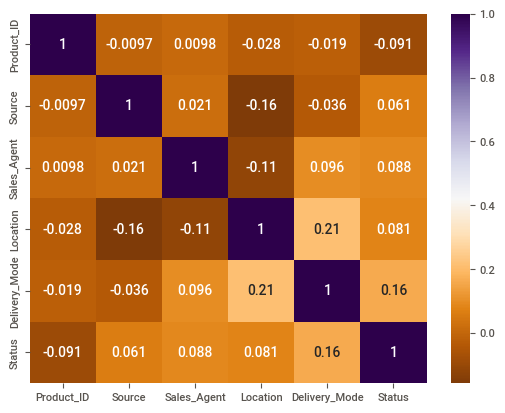

In [ ]:
sns.heatmap(data.corr(),annot=True,cmap='PuOr')
plt.show()

- There are No Correlated Features.

# Save Preprocess Data

In [ ]:
data.to_csv("preprocess.csv")
df = pd.read_csv("preprocess.csv")
df.head()

,Unnamed: 0,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status
0,0,18,5,10,8,4,0
1,1,18,5,1,8,4,0
2,2,18,5,1,8,4,0
3,3,18,5,1,8,4,0
4,4,18,5,1,8,4,0


# Model Creation

In [ ]:
#define dependent and independent variables
x = df.iloc[:,1:6]
y = df.Status

In [ ]:
x.head()

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode
0,18,5,10,8,4
1,18,5,1,8,4
2,18,5,1,8,4
3,18,5,1,8,4
4,18,5,1,8,4


In [ ]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Status, dtype: int64

### Balancing the dataset

In [ ]:
df.Status.value_counts()

1    4491
0    2931
Name: Status, dtype: int64

In [ ]:
# balancing data
from collections import Counter
from imblearn.over_sampling import SMOTE
sm = SMOTE() #object creation
print("unbalanced data",Counter(y))
x_sm,y_sm = sm.fit_resample(x,y)
print('Balanced data',Counter(y_sm))

unbalanced data Counter({1: 4491, 0: 2931})
Balanced data Counter({0: 4491, 1: 4491})


In [ ]:
#splitting the data into training and testing data
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_sm,y_sm,test_size=0.2,random_state=42)

In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(7185, 5)
(1797, 5)
(7185,)
(1797,)


# 1.Logistic Regression

In [ ]:
# Step:1 importing library
from sklearn.linear_model import LogisticRegression

# Step:2 Object creation
log_reg = LogisticRegression(random_state=5)

# Step:3 fitting the training data
log_reg.fit(x_train,y_train)

# Step:4 Prediction on test data
log_test_predict = log_reg.predict(x_test)

# Step:5 Prediction on training data
log_train_predict = log_reg.predict(x_train)

# Evaluation Metrics

In [ ]:
#Training Accuracy
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,classification_report,confusion_matrix
log_train_accuracy = accuracy_score(log_train_predict,y_train)
print("Training accuracy of Logistic regression model",log_train_accuracy*100)
print("Logistic regression training Classification report:- \n",classification_report(log_train_predict,y_train))

Training accuracy of Logistic regression model 59.554627696590124
Logistic regression training Classification report:- 
               precision    recall  f1-score   support

           0       0.58      0.59      0.59      3487
           1       0.61      0.60      0.60      3698

    accuracy                           0.60      7185
   macro avg       0.60      0.60      0.60      7185
weighted avg       0.60      0.60      0.60      7185



In [ ]:
#Testing Accuracy
log_test_accuracy = accuracy_score(log_test_predict,y_test)
print("Testing accuracy of Logistic regression model",log_test_accuracy*100)
print("Logistic regression testing Classification report:- \n",classification_report(log_test_predict,y_test))

Testing accuracy of Logistic regression model 60.489705063995544
Logistic regression testing Classification report:- 
               precision    recall  f1-score   support

           0       0.60      0.62      0.61       890
           1       0.61      0.59      0.60       907

    accuracy                           0.60      1797
   macro avg       0.61      0.61      0.60      1797
weighted avg       0.61      0.60      0.60      1797



- Logistic Regression does not perform well on both training and testing data

# 2.K-NearestNeighbours Classifier

In [ ]:
# Step:1 Taking the optimal value of k
from sklearn.neighbors import KNeighborsClassifier
error_rate = [] # Creating empty list
for i in range(2,11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    y_knn_predict = knn.predict(x_test)
    error_rate.append(np.mean(y_knn_predict != y_test))
print("Error rate:",error_rate)

Error rate: [0.2793544796883695, 0.2882582081246522, 0.26933778519755147, 0.26655537006121316, 0.2565386755703951, 0.2676683361157485, 0.27434613244296047, 0.2815804117974402, 0.26822481914301616]


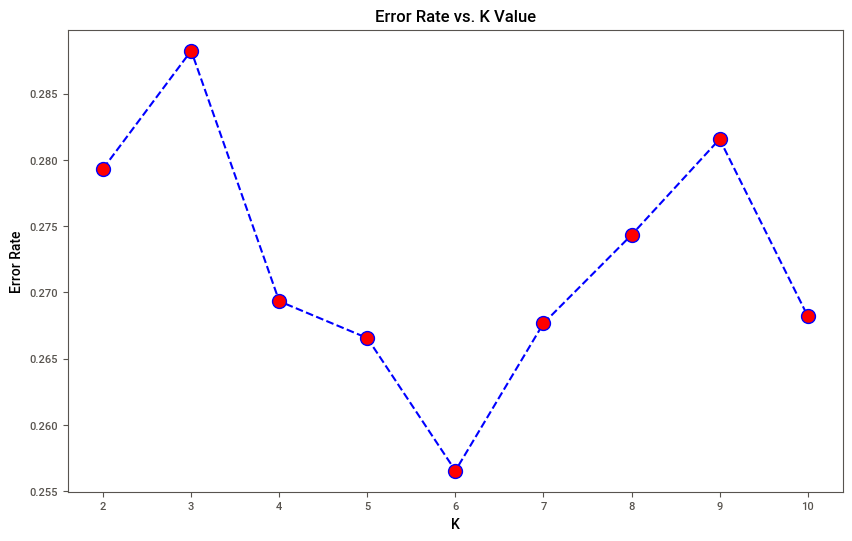

In [ ]:
# Step:2 Plotting the error rate
plt.figure(figsize=(10,6))
plt.plot(range(2,11),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

In [ ]:
# Step:3 Get nearst neighbors
knn1 = KNeighborsClassifier(n_neighbors=4)

# Step:4 Fitting the training data
knn1.fit(x_train,y_train)

# Step:5 Prediction on testing data
knn_test_predict = knn1.predict(x_test)

# Step:6 Prediction on training data
knn_train_predict = knn1.predict(x_train)

# Evaluation Metrics

In [ ]:
#Training Accuracy
knn_train_accuracy = accuracy_score(y_train,knn_train_predict)
print("Training accuracy of knn model ",knn_train_accuracy*100)
print("Training classification report:\n",classification_report(knn_train_predict,y_train))

Training accuracy of knn model  78.20459290187891
Training classification report:
               precision    recall  f1-score   support

           0       0.89      0.73      0.80      4355
           1       0.67      0.86      0.76      2830

    accuracy                           0.78      7185
   macro avg       0.78      0.80      0.78      7185
weighted avg       0.81      0.78      0.78      7185



In [ ]:
#Testing Accuracy
knn_test_accuracy = accuracy_score(y_test,knn_test_predict)
print("Testing accuracy of knn model",knn_test_accuracy*100)
print("Testing classification report: \n",classification_report(y_test,knn_test_predict))

Testing accuracy of knn model 73.06622148024485
Testing classification report: 
               precision    recall  f1-score   support

           0       0.70      0.83      0.76       926
           1       0.78      0.62      0.69       871

    accuracy                           0.73      1797
   macro avg       0.74      0.73      0.73      1797
weighted avg       0.74      0.73      0.73      1797



- KNN performs slightly well on training data
- But KNN is lagging for testing data so apply bagging for KNN

# Use Bagging On K-NearestNeighbours Classifier

In [ ]:
# step:1 Create a K-neighbour classifier object
knn1 = KNeighborsClassifier(n_neighbors=3)

# Step:2 importing library and creating bagging object
from sklearn.ensemble import BaggingClassifier
bagg = BaggingClassifier(base_estimator=knn1,n_estimators=50)
#base_estimator---> algorithm which you want to pass
#n_estimotors-----> number of base learners

# Step:3 Fitting the training data
bagg.fit(x_train,y_train)

# Step:4 Prediction on test data
bagg_predict = bagg.predict(x_test)

# Evaluation Metrics

In [ ]:
bagg_accuracy = accuracy_score(y_test,bagg_predict)
print("Score after bagging:",bagg_accuracy*100)

Score after bagging: 73.1775180856984


- After applying bagging accuracy is improved slightly.

# 3.Decision Tree

In [ ]:
# Step:1 Importing library and object creation
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()

# Step:2 fitting training data
dtc.fit(x_train,y_train)

# Step:3 Prediction on test data
dtc_test_predict = dtc.predict(x_test)

# Step:4 Prediction on training data
dtc_train_predict = dtc.predict(x_train)

# Evaluation Metrics

In [ ]:
#Training Accuracy
dtc_train_accuracy = accuracy_score(y_train,dtc_train_predict)
print("Training accuracy of Decision tree classifier:",dtc_train_accuracy*100)
print("classification report of training:- "'\n',classification_report(y_train,dtc_train_predict))

Training accuracy of Decision tree classifier: 84.05010438413362
classification report of training:- 
               precision    recall  f1-score   support

           0       0.80      0.91      0.85      3565
           1       0.90      0.77      0.83      3620

    accuracy                           0.84      7185
   macro avg       0.85      0.84      0.84      7185
weighted avg       0.85      0.84      0.84      7185



In [ ]:
#Testing Accuracy
dtc_test_accuracy = accuracy_score(y_test,dtc_test_predict)
print("Training accuracy of Decision tree classifier:",dtc_test_accuracy*100)
print("classification report of training:"'\n',classification_report(y_test,dtc_test_predict))

Training accuracy of Decision tree classifier: 72.56538675570395
classification report of training:
               precision    recall  f1-score   support

           0       0.71      0.80      0.75       926
           1       0.75      0.65      0.70       871

    accuracy                           0.73      1797
   macro avg       0.73      0.72      0.72      1797
weighted avg       0.73      0.73      0.72      1797



- Decision Tree Classifier Performed well on Training Accuracy but not performed well on Testing Accuracy.

# Hyper Parameter Tuning(decision tree)

In [ ]:
# Step:1 importing library
from sklearn.model_selection import GridSearchCV

# Step:2 Tunning the parameter
params = {
    "criterion":("gini", "entropy"),
    "splitter":("best", "random"),
    "max_depth":(list(range(1, 30))),
    "min_samples_split":[2, 3, 4,5],
    "min_samples_leaf":list(range(1, 10)),
}


tree_c = DecisionTreeClassifier(random_state=3)
tree_cv = GridSearchCV(tree_c, params, scoring="f1", n_jobs=-1, verbose=2, cv=3)

# Fitting traning data
tree_cv.fit(x_train,y_train)

# Get the best parameter
best_params = tree_cv.best_params_
print(f"Best paramters: {best_params}")

Fitting 3 folds for each of 4176 candidates, totalling 12528 fits
Best paramters: {'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'random'}


In [ ]:
# Step:3 place the parameter on decision tree classifier
dt1=DecisionTreeClassifier(criterion='gini',
                           max_depth=13,min_samples_leaf=1,
                           min_samples_split=2,splitter='best')

# Evaluation Metrics

In [ ]:
dt1_test_accuracy = accuracy_score(y_test,dtc_test_predict)
print("Accuracy score:",dt1_test_accuracy*100)
print("Classification report:"'\n',classification_report(y_test,dtc_test_predict))

Accuracy score: 72.56538675570395
Classification report:
               precision    recall  f1-score   support

           0       0.71      0.80      0.75       926
           1       0.75      0.65      0.70       871

    accuracy                           0.73      1797
   macro avg       0.73      0.72      0.72      1797
weighted avg       0.73      0.73      0.72      1797



# 4.Random Forest Classifier

In [ ]:
# Step:1 import library and object creation
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()

# Step:2 fitting the training data
rf.fit(x_train,y_train)

# Step:3 Prediction on test data
rf_test_predict = rf.predict(x_test)

# Step:4 Prediction on training data
rf_train_predict = rf.predict(x_train)

# Evaluation Metrics

In [ ]:
#training accuracy
rf_train_accuracy = accuracy_score(y_train,rf_train_predict)
print("Training accuracy of random forest classifier:",rf_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(y_train,rf_train_predict))

Training accuracy of random forest classifier: 84.05010438413362
Classification report of training:
               precision    recall  f1-score   support

           0       0.82      0.88      0.85      3565
           1       0.87      0.80      0.84      3620

    accuracy                           0.84      7185
   macro avg       0.84      0.84      0.84      7185
weighted avg       0.84      0.84      0.84      7185



In [ ]:
#testing accuracy
rf_test_accuracy = accuracy_score(y_test,rf_test_predict)
print("Testing accuracy of random forest classifier:",rf_test_accuracy*100)
print("Classification report of training:"'\n',classification_report(y_test,rf_test_predict))

Testing accuracy of random forest classifier: 73.40011129660546
Classification report of training:
               precision    recall  f1-score   support

           0       0.73      0.77      0.75       926
           1       0.74      0.70      0.72       871

    accuracy                           0.73      1797
   macro avg       0.73      0.73      0.73      1797
weighted avg       0.73      0.73      0.73      1797



# Hyper Parameter Tuning(Random Forest)

In [ ]:
# Step:1 [imutation of parameter]
from sklearn.model_selection import RandomizedSearchCV
# not used grid search cv because of memory

n_estimators = [int(x) for x in np.linspace(start=100, stop=2000, num=10)]
max_features = ['auto', 'sqrt'] ### auto - select randomly, sqrt -
max_depth = [int(x) for x in np.linspace(10, 110, num=10)] ### level in the tree
max_depth.append(None)
min_samples_split = [2, 5, 15]
min_samples_leaf = [1, 2, 4]


# Step:2 make a dictionary of parameter
random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

# Step:3 Object creation
rf_clf1 = RandomForestClassifier(random_state=42)
# provide random state beacuse select row and column randomly


# Step:4 randomized search cv with parameter
rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='f1',param_distributions=random_grid, n_iter=100, cv=3,
                               verbose=3, random_state=42, n_jobs=-1)


# Step:5 fitting the training data
rf_cv.fit(x_train, y_train)

# Step:6 Getting the best parameter
rf_best_params = rf_cv.best_params_
print(f"Best paramters: {rf_best_params})")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'n_estimators': 311, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 43})


In [ ]:
# Step:7
rf_clf2 = RandomForestClassifier(**rf_best_params)

# Step:8 Fitting the training data
rf_clf2.fit(x_train,y_train)

# Step:9 Prediction on test data
y_predict = rf_clf2.predict(x_test)

# Evaluation Metrics

In [ ]:
test_accuracy = accuracy_score(y_test,y_predict)
print("Testing accuracy after hyper parameter tuning:",test_accuracy*100)

Testing accuracy after hyper parameter tuning: 73.90094602114635


# 5.GB Classifier

In [ ]:
# Step:1 Object creation
from sklearn.ensemble import GradientBoostingClassifier
gbm=GradientBoostingClassifier(learning_rate=0.1,n_estimators=150,random_state=42)

# Step:2 fitting the training data
gbm.fit(x_train,y_train) ## fitting the data

# Step:3 prediction on test data
gbm_test_predict=gbm.predict(x_test)

# Step:4 Prediction on train data
gbm_train_predict = gbm.predict(x_train)

# Evaluation Metrics

In [ ]:
#training accuracy
gbm_train_accuracy = accuracy_score(y_train,gbm_train_predict)
print("Gradient boosting classifier training accuracy:",gbm_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(y_train,gbm_train_predict))

Gradient boosting classifier training accuracy: 74.09881697981908
Classification report of training:
               precision    recall  f1-score   support

           0       0.73      0.77      0.75      3565
           1       0.76      0.71      0.74      3620

    accuracy                           0.74      7185
   macro avg       0.74      0.74      0.74      7185
weighted avg       0.74      0.74      0.74      7185



In [ ]:
#testing accuracy
gbm_test_accuracy = accuracy_score(y_test,gbm_test_predict)
print("Gradient boosting classifier testing accuracy:",gbm_test_accuracy*100)
print("Classification report of testing:"'\n',classification_report(y_test,gbm_test_predict))

Gradient boosting classifier testing accuracy: 73.95659432387312
Classification report of testing:
               precision    recall  f1-score   support

           0       0.75      0.75      0.75       926
           1       0.73      0.73      0.73       871

    accuracy                           0.74      1797
   macro avg       0.74      0.74      0.74      1797
weighted avg       0.74      0.74      0.74      1797



# 6.XGB Classifier

In [ ]:
# Step:1 import library and object creation
import xgboost
from xgboost import XGBClassifier
xgb = XGBClassifier()

# Step:2 Fitting the training data
xgb.fit(x_train,y_train)

# Step:3 Prediction on training data
xgb_train_predict = xgb.predict(x_train)

# Step:4 Prediction on testing data
xgb_test_predict = xgb.predict(x_test)

# Evaluation Metrics

In [ ]:
#training accuracy
xgb_train_accuracy = accuracy_score(xgb_train_predict,y_train)
print("Training accuracy of xgb model",xgb_train_accuracy*100)
print("Classifiaction report on training: \n",classification_report(xgb_train_predict,y_train))

Training accuracy of xgb model 79.6242171189979
Classifiaction report on training: 
               precision    recall  f1-score   support

           0       0.82      0.78      0.80      3747
           1       0.77      0.81      0.79      3438

    accuracy                           0.80      7185
   macro avg       0.80      0.80      0.80      7185
weighted avg       0.80      0.80      0.80      7185



In [ ]:
#testing accuracy
xgb_test_accuracy = accuracy_score(xgb_test_predict,y_test)
print("Testing accuracy of xgb model",xgb_test_accuracy*100)
print("Classification report on testing: \n",classification_report(xgb_test_predict,y_test))

Testing accuracy of xgb model 73.67835281023929
Classification report on testing: 
               precision    recall  f1-score   support

           0       0.74      0.74      0.74       925
           1       0.73      0.73      0.73       872

    accuracy                           0.74      1797
   macro avg       0.74      0.74      0.74      1797
weighted avg       0.74      0.74      0.74      1797



# Hyper Parameter Tuning

In [ ]:
# Step:1 import library
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'gamma': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4, 200],
              'learning_rate': [0.001,0.01,0.1, 0.03, 0.06, 0.1, 0.15, 0.02,0.003, 0.4, 0.5, 0.6, 0.7],
              'max_depth': [3,5,6,7,8,10],
              'n_estimators': [50,65,80,100,130,150],
              'reg_alpha': [0,0.01,0.1,0.02,0.2,0.4,0.8,1.6,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda': [0,0.01,0.1,0.02,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

# Step:2 Object creation with parameter
XGB = XGBClassifier(random_state=42)

# Step:3 Create randomized search cv with parameter
rcv = RandomizedSearchCV(estimator=XGB,scoring='f1',param_distributions=param_grid,n_iter=150,
                        cv=5,verbose=3,random_state=5,n_jobs=-1)

#estimator--number of decision tree
#scoring--->performance matrix to check performance
#param_distribution-->hyperparametes(dictionary we created)
#n_iter--->Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.default=10
##cv------> number of folds
#verbose=Controls the verbosity: the higher, the more messages.
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.

# Step:4 Fitting training data on randomized search cv
rcv.fit(x_train,y_train)

# Step:5 Get best parameters
rcv_best_parameter = rcv.best_params_
print(f"Best parameter: {rcv_best_parameter}")

Fitting 5 folds for each of 150 candidates, totalling 750 fits
Best parameter: {'reg_lambda': 12.8, 'reg_alpha': 0, 'n_estimators': 65, 'max_depth': 10, 'learning_rate': 0.6, 'gamma': 0.4}


In [ ]:
# Step:6 Place the best parameter
XGB2 = XGBClassifier(reg_lambda=25.6,reg_alpha=0.8,n_estimators=150,max_depth=10,learning_rate=0.4,gamma=0.2)

# Step:7 Fitting the training data
XGB2.fit(x_train,y_train)

# Step:8 Prediction on testing data
XGB_prediction = XGB2.predict(x_test)

In [ ]:
XGB_accuracy = accuracy_score(XGB_prediction,y_test)
print("Accuracy score after hyperparameter tunning",XGB_accuracy*100)
print("Classification report: \n",classification_report(XGB_prediction,y_test))

Accuracy score after hyperparameter tunning 72.78797996661102
Classification report: 
               precision    recall  f1-score   support

           0       0.73      0.74      0.73       917
           1       0.72      0.72      0.72       880

    accuracy                           0.73      1797
   macro avg       0.73      0.73      0.73      1797
weighted avg       0.73      0.73      0.73      1797



# 7.Artificial Neural Network

In [ ]:
# Step:1 Importing library and object creation
from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(50,2),
                      learning_rate='constant',
                      max_iter=1000,
                      random_state=45)

# Step:2 Fitting the training data
model.fit(x_train,y_train)

MLPClassifier(hidden_layer_sizes=(50, 2), max_iter=1000, random_state=45)

In [ ]:
# Step:3 Predicting the probability
mlp_predict_probability = model.predict_proba(x_test)
mlp_predict_probability

array([[0.72534558, 0.27465442],
       [0.72388552, 0.27611448],
       [0.73419235, 0.26580765],
       ...,
       [0.78042635, 0.21957365],
       [0.0853941 , 0.9146059 ],
       [0.42825893, 0.57174107]])

In [ ]:
# Step:4 Prediction on test data
mlp_test_predict = model.predict(x_test)

# Step:5 Prediction on training data
mlp_train_predict = model.predict(x_train)

In [ ]:
#training accuracy
mlp_train_accuracy = accuracy_score(mlp_train_predict,y_train)
print("Training accuracy of MLP model is:",mlp_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(mlp_train_predict,y_train))

Training accuracy of MLP model is: 68.9491997216423
Classification report of training:
               precision    recall  f1-score   support

           0       0.81      0.65      0.72      4450
           1       0.57      0.75      0.65      2735

    accuracy                           0.69      7185
   macro avg       0.69      0.70      0.69      7185
weighted avg       0.72      0.69      0.69      7185



In [ ]:
#testing accuracy
mlp_test_accuracy = accuracy_score(mlp_test_predict,y_test)
print("Testing accuracy of MLP model is:",mlp_test_accuracy*100)
print("Classification report of testing:"'\n',classification_report(mlp_test_predict,y_test))

Testing accuracy of MLP model is: 69.2821368948247
Classification report of testing:
               precision    recall  f1-score   support

           0       0.81      0.67      0.73      1126
           1       0.57      0.74      0.64       671

    accuracy                           0.69      1797
   macro avg       0.69      0.70      0.69      1797
weighted avg       0.72      0.69      0.70      1797



# Conclusion:-
- From all the above models Gradient Boosting classifier Performs well on both training and testing data.